In [ ]:
# !pip install category_encoders

In [1]:
#Initial cell, library imports and data directories
from google.colab import drive
drive.mount('/gdrive')
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
# import category_encoders as ce
from glob import glob
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

DIR_DATA = '/gdrive/MyDrive/BigData Project'
os.listdir(DIR_DATA)

Mounted at /gdrive


['data.array',
 'TOS Kaggle data week ending 2024 01 05.csv',
 'TOS Kaggle data week ending 2024 02 09.csv',
 'TOS Kaggle data week ending 2024 02 02.csv',
 'TOS Kaggle data week ending 2024 01 12.csv',
 'TOS Kaggle data week ending 2024 01 26.csv',
 'TOS Kaggle data week ending 2024 01 19.csv',
 'TOS Kaggle data week ending 2024 02 16.csv']

In [2]:
# Define the filename pattern
filename_pattern = 'TOS Kaggle data week ending 2024*'

# Find files matching the pattern in the directory
files = glob(os.path.join(DIR_DATA, filename_pattern))

# Check if any files match the pattern
if files:
    # Read the first matching file (assuming only one file matches)
    data = pd.read_csv(files[0])
    # Process the data as needed
    print(data.head())  # Example: print the first few rows of the DataFrame
else:
    print("No files found matching the pattern.")


        ID                TimeStamp      /ES       /NQ    /RTY     SPY  \
0  3323331  2023-12-31 17:59:08.000  4812.75  17003.75  2044.9  475.31   
1  3323332  2023-12-31 17:59:11.000  4812.75  17003.75  2044.9  475.31   
2  3323333  2023-12-31 17:59:14.000  4812.75  17003.75  2044.9  475.31   
3  3323334  2023-12-31 17:59:17.000  4812.75  17003.75  2044.9  475.31   
4  3323335  2023-12-31 17:59:20.000  4812.75  17003.75  2044.9  475.31   

      QQQ     IWM    AAPL    MSFT  ...    TNX    TYX  /ES volume    TLT  \
0  409.52  200.71  192.53  376.04  ...  38.66  40.19           0  98.88   
1  409.52  200.71  192.53  376.04  ...  38.66  40.19           0  98.88   
2  409.52  200.71  192.53  376.04  ...  38.66  40.19           0  98.88   
3  409.52  200.71  192.53  376.04  ...  38.66  40.19           0  98.88   
4  409.52  200.71  192.53  376.04  ...  38.66  40.19           0  98.88   

   TLT volume    VIX      SPX  SPX PCR  SPY PCR  /ES PCR  
0  41616180.0  12.45  4769.83    1.896    1.3

In [3]:
dfs = []
for file in files:
    dfs.append(pd.read_csv(file))

prices2024 = pd.concat(dfs, ignore_index=True)
prices2024

,ID,TimeStamp,/ES,/NQ,/RTY,SPY,QQQ,IWM,AAPL,MSFT,...,TNX,TYX,/ES volume,TLT,TLT volume,VIX,SPX,SPX PCR,SPY PCR,/ES PCR
0,3323331,2023-12-31 17:59:08.000,4812.75,17003.75,2044.9,475.31,409.52,200.71,192.53,376.04,...,38.66,40.19,0,98.88,41616180.0,12.45,4769.83,1.896,1.303,5.013
1,3323332,2023-12-31 17:59:11.000,4812.75,17003.75,2044.9,475.31,409.52,200.71,192.53,376.04,...,38.66,40.19,0,98.88,0.0,12.45,4769.83,1.896,1.303,5.013
2,3323333,2023-12-31 17:59:14.000,4812.75,17003.75,2044.9,475.31,409.52,200.71,192.53,376.04,...,38.66,40.19,0,98.88,0.0,12.45,4769.83,1.896,1.303,5.013
3,3323334,2023-12-31 17:59:17.000,4812.75,17003.75,2044.9,475.31,409.52,200.71,192.53,376.04,...,38.66,40.19,0,98.88,0.0,12.45,4769.83,1.896,1.303,5.013
4,3323335,2023-12-31 17:59:20.000,4812.75,17003.75,2044.9,475.31,409.52,200.71,192.53,376.04,...,38.66,40.19,0,98.88,0.0,12.45,4769.83,1.896,1.303,5.013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
989313,4318781,2024-02-16 18:00:45.000,5014.50,17721.50,2037.1,499.51,430.57,201.66,182.31,404.06,...,42.95,44.48,0,92.76,0.0,14.24,5005.57,1.489,1.233,2.202
989314,4318782,2024-02-16 18:00:48.000,5014.50,17721.50,2037.1,499.51,430.57,201.66,182.31,404.06,...,42.95,44.48,0,92.76,0.0,14.24,5005.57,1.489,1.233,2.202
989315,4318783,2024-02-16 18:00:51.000,5014.50,17721.50,2037.1,499.51,430.57,201.66,182.31,404.06,...,42.95,44.48,0,92.76,0.0,14.24,5005.57,1.489,1.233,2.202
989316,4318784,2024-02-16 18:00:54.000,5014.50,17721.50,2037.1,499.51,430.57,201.66,182.31,404.06,...,42.95,44.48,0,92.76,0.0,14.24,5005.57,1.489,1.233,2.202


In [4]:
prices2024['TimeStamp'] = pd.to_datetime(prices2024['TimeStamp'])
prices2024 = prices2024.sort_values(by = ['TimeStamp'])

In [5]:
prices2024

,ID,TimeStamp,/ES,/NQ,/RTY,SPY,QQQ,IWM,AAPL,MSFT,...,TNX,TYX,/ES volume,TLT,TLT volume,VIX,SPX,SPX PCR,SPY PCR,/ES PCR
0,3323331,2023-12-31 17:59:08,4812.75,17003.75,2044.9,475.31,409.52,200.71,192.53,376.04,...,38.66,40.19,0,98.88,41616180.0,12.45,4769.83,1.896,1.303,5.013
1,3323332,2023-12-31 17:59:11,4812.75,17003.75,2044.9,475.31,409.52,200.71,192.53,376.04,...,38.66,40.19,0,98.88,0.0,12.45,4769.83,1.896,1.303,5.013
2,3323333,2023-12-31 17:59:14,4812.75,17003.75,2044.9,475.31,409.52,200.71,192.53,376.04,...,38.66,40.19,0,98.88,0.0,12.45,4769.83,1.896,1.303,5.013
3,3323334,2023-12-31 17:59:17,4812.75,17003.75,2044.9,475.31,409.52,200.71,192.53,376.04,...,38.66,40.19,0,98.88,0.0,12.45,4769.83,1.896,1.303,5.013
4,3323335,2023-12-31 17:59:20,4812.75,17003.75,2044.9,475.31,409.52,200.71,192.53,376.04,...,38.66,40.19,0,98.88,0.0,12.45,4769.83,1.896,1.303,5.013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
989313,4318781,2024-02-16 18:00:45,5014.50,17721.50,2037.1,499.51,430.57,201.66,182.31,404.06,...,42.95,44.48,0,92.76,0.0,14.24,5005.57,1.489,1.233,2.202
989314,4318782,2024-02-16 18:00:48,5014.50,17721.50,2037.1,499.51,430.57,201.66,182.31,404.06,...,42.95,44.48,0,92.76,0.0,14.24,5005.57,1.489,1.233,2.202
989315,4318783,2024-02-16 18:00:51,5014.50,17721.50,2037.1,499.51,430.57,201.66,182.31,404.06,...,42.95,44.48,0,92.76,0.0,14.24,5005.57,1.489,1.233,2.202
989316,4318784,2024-02-16 18:00:54,5014.50,17721.50,2037.1,499.51,430.57,201.66,182.31,404.06,...,42.95,44.48,0,92.76,0.0,14.24,5005.57,1.489,1.233,2.202


In [6]:
prices2024.dtypes

ID                     int64
TimeStamp     datetime64[ns]
/ES                  float64
/NQ                  float64
/RTY                 float64
SPY                  float64
QQQ                  float64
IWM                  float64
AAPL                 float64
MSFT                 float64
NVDA                 float64
XLK                  float64
XLF                  float64
XLP                  float64
XLY                  float64
XTN                  float64
HYG                  float64
TNX                  float64
TYX                  float64
/ES volume             int64
TLT                  float64
TLT volume           float64
VIX                  float64
SPX                  float64
SPX PCR              float64
SPY PCR              float64
/ES PCR              float64
dtype: object

In [7]:
prices2024.set_index('TimeStamp', inplace=True)
#prices2024.iloc[:,1:].stack()

In [8]:
prices2024.drop(['/ES volume','TLT volume','VIX','SPX PCR', 'SPY PCR', '/ES PCR', 'ID'],axis = 1, inplace = True)

In [9]:
prices2024.describe()

,/ES,/NQ,/RTY,SPY,QQQ,IWM,AAPL,MSFT,NVDA,XLK,XLF,XLP,XLY,XTN,HYG,TNX,TYX,TLT,SPX
count,989318.000000,989318.000000,989318.000000,989318.000000,989318.000000,989318.000000,989318.000000,989318.000000,989318.000000,989318.000000,989318.000000,989318.000000,989318.000000,989318.000000,989318.000000,989318.000000,989318.000000,989318.000000,989318.000000
mean,4887.807213,17324.972808,1986.319661,484.393549,418.603154,195.627227,187.548308,395.451730,604.099423,197.503313,38.301872,72.793852,175.211432,80.885022,77.215985,40.757246,42.749672,95.367372,4859.484994
std,96.881113,467.478245,34.738299,10.548532,11.983779,3.431277,3.870792,15.165388,80.954794,6.979620,0.695823,0.692203,2.554994,1.790881,0.311341,1.124075,1.199540,1.792687,104.125737
min,4702.500000,16338.250000,1905.000000,466.550000,395.380000,187.560000,179.370200,366.630000,473.390000,183.440000,36.954100,71.565000,169.730000,76.300000,76.440000,38.170000,40.190000,92.230000,4682.220000
25%,4799.000000,16923.250000,1962.800000,475.310000,409.350000,193.250000,184.410000,382.770000,543.500000,191.770000,37.650000,72.270000,173.530000,79.600000,77.040000,39.910000,41.900000,93.900000,4769.830000
50%,4894.750000,17474.500000,1983.400000,484.860000,421.880000,195.080000,186.826750,398.900000,610.310000,200.820000,38.320000,72.680000,174.720000,80.729700,77.190000,40.910000,43.080000,94.820000,4864.600000
75%,4969.750000,17702.500000,2006.500000,493.980000,428.450000,197.490000,189.485000,406.560000,682.230000,203.250000,38.830000,73.170000,177.320000,82.180000,77.390000,41.600000,43.760000,96.660000,4953.170000
max,5066.500000,18121.000000,2071.000000,503.490000,439.139000,204.750000,196.360000,420.719600,746.098600,208.460000,39.845000,74.480000,180.880000,84.647700,77.915000,43.280000,44.860000,98.880000,5048.390000


# First Approach

In [ ]:
df = pd.DataFrame(prices2024.stack())

In [ ]:
df.index.names = ['TS','Ticker']
df.columns = ['Price']

In [ ]:
!pip install pandas_ta

In [ ]:
import pandas_ta

In [ ]:
df['rsi']=df.groupby(level=1)['Price'].transform(lambda x: pandas_ta.rsi(close = x, length = 200000))
df['bb_low']=df.groupby(level=1)['Price'].transform(lambda x: pandas_ta.bbands(close = np.log1p(x), length = 200000).iloc[:,0])
df['bb_mid']=df.groupby(level=1)['Price'].transform(lambda x: pandas_ta.bbands(close = np.log1p(x), length = 200000).iloc[:,1])
df['bb_high']=df.groupby(level=1)['Price'].transform(lambda x: pandas_ta.bbands(close = np.log1p(x), length = 200000).iloc[:,2])

In [ ]:
def compute_macd(close):
  macd = pandas_ta.macd(close = close, length = 200000).iloc[:,0]
  return macd.sub(macd.mean()).div(macd.std())

In [ ]:
df['macd'] = df.groupby(level=1, group_keys = False)['Price'].apply(compute_macd)

In [ ]:
#df.xs('AAPL', level = 1)['bb_low'].plot()
#df.xs('AAPL', level = 1)['bb_mid'].plot()
#df.xs('AAPL', level = 1)['bb_high'].plot()

In [ ]:
def calculate_returns(df):
  outlier_cutoff = 0.005
  lags = [1,2,3,6,9,12]
  for lag in lags:
    df[f'Return_{lag}t'] = (df['Price']
                            .pct_change(lag)
                            .pipe(lambda x: x.clip(lower = x.quantile(outlier_cutoff),
                                                   upper = x.quantile(1-outlier_cutoff)))
                            .add(1)
                            .pow(1/lag)
                            .sub(1))
  return df

In [ ]:
data = df.iloc[1000000:].groupby(level = 1, group_keys = False).apply(calculate_returns).dropna()

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 14997042 entries, (Timestamp('2024-01-09 16:56:52'), '/ES') to (Timestamp('2024-02-16 18:00:57'), 'SPX')
Data columns (total 12 columns):
 #   Column      Dtype  
---  ------      -----  
 0   Price       float64
 1   rsi         float64
 2   bb_low      float64
 3   bb_mid      float64
 4   bb_high     float64
 5   macd        float64
 6   Return_1t   float64
 7   Return_2t   float64
 8   Return_3t   float64
 9   Return_6t   float64
 10  Return_9t   float64
 11  Return_12t  float64
dtypes: float64(12)
memory usage: 1.4+ GB


In [ ]:
from sklearn.cluster import KMeans

def get_clusters(df):
  df['Cluster'] = KMeans(n_clusters = 4,
                         random_state = 12,
                         init = 'random').fit(df).labels_
  return df



In [ ]:
#data = data.iloc[13000000:].dropna().groupby('TS', group_keys = False).apply(get_clusters)

In [ ]:
target_rsi_values = [30, 45, 55, 70]

initial_centroids = np.zeros((len(target_rsi_values), 2))

initial_centroids[:,1] = target_rsi_values

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
df_PCA = pca.fit_transform(data)

In [ ]:
kmeans = KMeans(n_clusters=4, random_state=42, init = 'random').fit(df_PCA)
#


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
data['label'] = kmeans.labels_
data

Price        rsi    bb_low    bb_mid   bb_high  \
TS                  Ticker                                                      
2024-01-09 16:56:52 /ES      4790.25  50.022588  8.457393  8.470714  8.484036   
                    /NQ     16829.00  50.037651  9.697839  9.722541  9.747244   
                    /RTY     1980.40  49.813049  7.571688  7.603009  7.634329   
                    SPY       473.88  50.087258  6.145016  6.158179  6.171343   
                    QQQ       405.75  50.081248  5.975239  5.999719  6.024200   
...                              ...        ...       ...       ...       ...   
2024-02-16 18:00:57 HYG        76.91  49.886234  4.351287  4.357606  4.363924   
                    TNX        42.95  50.717389  3.736624  3.765315  3.794006   
                    TYX        44.48  50.484098  3.787171  3.807349  3.827526   
                    TLT        92.76  49.686332  4.533650  4.548070  4.562489   
                    SPX      5005.57  50.263585  8.507743  8.518031  8.528319   

                                macd  Return_1t  Return_2t  Return_3t  \
TS                  Ticker                                              
2024-01-09 16:56:52 /ES    -0.566915   0.000000   0.000000   0.000000   
                    /NQ    -0.290072  -0.000015   0.000007   0.000005   
                    /RTY   -0.792201   0.000000   0.000000   0.000000   
                    SPY    -0.008164   0.000000   0.000000   0.000000   
                    QQQ    -0.005756   0.000000   0.000000   0.000000   
...                              ...        ...        ...        ...   
2024-02-16 18:00:57 HYG     0.001629   0.000000   0.000000   0.000000   
                    TNX    -0.006766   0.000000   0.000000   0.000000   
                    TYX    -0.007578   0.000000   0.000000   0.000000   
                    TLT     0.007047   0.000000   0.000000   0.000000   
                    SPX    -0.008091   0.000000   0.000000   0.000000   

                            Return_6t  Return_9t  Return_12t  label  
TS                  Ticker                                           
2024-01-09 16:56:52 /ES      0.000000   0.000000   -0.000004      2  
                    /NQ      0.000002   0.000002    0.000001      3  
                    /RTY    -0.000017   0.000000   -0.000008      0  
                    SPY      0.000000   0.000000    0.000000      1  
                    QQQ      0.000000   0.000000    0.000000      1  
...                               ...        ...         ...    ...  
2024-02-16 18:00:57 HYG      0.000000   0.000000    0.000000      1  
                    TNX      0.000000   0.000000    0.000000      1  
                    TYX      0.000000   0.000000    0.000000      1  
                    TLT      0.000000   0.000000    0.000000      1  
                    SPX      0.000000   0.000000    0.000000      2  

[14997042 rows x 13 columns]

In [ ]:
filtered_df = data[data['label'] == 3].copy()

filtered_df = filtered_df.reset_index(level = 1)

filtered_df.index = filtered_df.index + pd.DateOffset(1)

filtered_df = filtered_df.reset_index().set_index(['TS', 'Ticker'])

dates = filtered_df.index.get_level_values('TS').unique().to_list()

fixed_dates = {}

for d in dates:
  fixed_dates[d] = filtered_df.xs(d, level=0).index.to_list()

In [ ]:
!pip install PyPortfolioOpt

ModuleNotFoundError: No module named 'PyPortfolioOpt'

In [ ]:
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import risk_models
from pypfopt import expected_returns

In [ ]:
def optimize_weights(prices, lower_bound = 0):

  returns = expected_returns.mean_historical_return(prices = prices,
                                                    frequency = 252)
  cov = risk_models.sample_cov(prices = prices,
                               fequency = 252)

  ef = EfficientFrontier(expected_returns = returns,
                         cov_matrix = cov,
                         weight_bounds = (lower_bound,1),
                         solver = 'SCS')

  weights = ef.max_sharpe()

  return ef.clean_weights()

In [ ]:
prices2024.columns

Index(['/ES', '/NQ', '/RTY', 'SPY', 'QQQ', 'IWM', 'AAPL', 'MSFT', 'NVDA',
       'XLK', 'XLF', 'XLP', 'XLY', 'XTN', 'HYG', 'TNX', 'TYX', 'TLT', 'SPX'],
      dtype='object')

# Second Approach

In [ ]:
prices2024

,/ES,/NQ,/RTY,SPY,QQQ,IWM,AAPL,MSFT,NVDA,XLK,XLF,XLP,XLY,XTN,HYG,TNX,TYX,TLT,SPX
TimeStamp,,,,,,,,,,,,,,,,,,,
2023-12-31 17:59:08,4812.75,17003.75,2044.9,475.31,409.52,200.71,192.53,376.04,495.22,192.48,37.60,72.03,178.81,83.49,77.39,38.66,40.19,98.88,4769.83
2023-12-31 17:59:11,4812.75,17003.75,2044.9,475.31,409.52,200.71,192.53,376.04,495.22,192.48,37.60,72.03,178.81,83.49,77.39,38.66,40.19,98.88,4769.83
2023-12-31 17:59:14,4812.75,17003.75,2044.9,475.31,409.52,200.71,192.53,376.04,495.22,192.48,37.60,72.03,178.81,83.49,77.39,38.66,40.19,98.88,4769.83
2023-12-31 17:59:17,4812.75,17003.75,2044.9,475.31,409.52,200.71,192.53,376.04,495.22,192.48,37.60,72.03,178.81,83.49,77.39,38.66,40.19,98.88,4769.83
2023-12-31 17:59:20,4812.75,17003.75,2044.9,475.31,409.52,200.71,192.53,376.04,495.22,192.48,37.60,72.03,178.81,83.49,77.39,38.66,40.19,98.88,4769.83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-02-16 18:00:45,5014.50,17721.50,2037.1,499.51,430.57,201.66,182.31,404.06,726.13,202.57,39.63,73.28,179.02,82.91,76.91,42.95,44.48,92.76,5005.57
2024-02-16 18:00:48,5014.50,17721.50,2037.1,499.51,430.57,201.66,182.31,404.06,726.13,202.57,39.63,73.28,179.02,82.91,76.91,42.95,44.48,92.76,5005.57
2024-02-16 18:00:51,5014.50,17721.50,2037.1,499.51,430.57,201.66,182.31,404.06,726.13,202.57,39.63,73.28,179.02,82.91,76.91,42.95,44.48,92.76,5005.57


In [ ]:
dif1 = (prices2024-prices2024.shift(1)).dropna()

In [ ]:
# from statsmodels.tsa.stattools import adfuller
# pv = {}
# for s in dif1.columns:
#   pv[s]=adfuller(dif1[f'{s}'],autolag='AIC', maxlag=12)[1]

# pv

In [ ]:
# from statsmodels.graphics.tsaplots import plot_acf
# plot_acf(dif1["/ES"].dropna(),lags=5,title="AutoCorrelation")
# plt.show()

In [ ]:
size = len(prices2024)
train = prices2024.iloc[:round(size*0.92)]
test = prices2024.iloc[round(size*0.92):]


In [ ]:
ex_tr = train['/ES']
ex_te = test['/ES']


In [ ]:
values_tr = ex_tr.values
values_te = ex_te.values


In [ ]:
history = [x for x in values_tr]
predictions = list()

In [ ]:
# from statsmodels.tsa.arima.model import ARIMA

# # walk-forward validation
# for t in range(len(ex_te)):
#     model = ARIMA(history, order=(3,1,3))
#     model_fit = model.fit()
#     output = model_fit.forecast()
#     yhat = output[0]
#     predictions.append(yhat)
#     obs = values_te[t]
#     history.append(obs)

In [ ]:
import dask.array as da
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA

# Define the order of the ARIMA model
order = (2, 2, 2)

# Define the size of the rolling window (number of data points to process at once)
window_size = 5000  # Adjust as needed based on your memory constraints

# Initialize an empty list to store the predictions
all_predictions = []

# Convert the test data to a Dask array
ex_te_dask = da.from_array(ex_te.values, chunks=(window_size,))

# Iterate over the dataset with a rolling window using Dask
for i in range(0, len(ex_te), window_size):
    # Extract the current window of test data
    window_te_dask = ex_te_dask[i:i+window_size]

    # Compute the corresponding window of training data
    start_index = max(0, i - window_size)  # Start index for training data
    window_tr = ex_tr.iloc[start_index:i+window_size]  # Extract the corresponding window of training data

    # Convert the training data to a pandas DataFrame
    values_tr_window = window_tr.values

    # Fit the ARIMA model to the current window of training data
    model = ARIMA(values_tr_window, order=order)
    model_fit = model.fit()

    # Use the fitted model to forecast the next step ahead
    forecast = model_fit.forecast(steps=len(window_te_dask))

    # Append the forecast to the list of predictions
    all_predictions.extend(forecast)

    # Print progress
    print(f'Progress: {i}/{len(ex_te)}')

# 'all_predictions' now contains the predictions for the entire test set
print(all_predictions)


In [ ]:
import dask.array as da
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA

# Define the order of the ARIMA model
order = (2, 2, 2)

# Define the size of the rolling window (number of data points to process at once)
window_size = 3000  # Adjust as needed based on your memory constraints

# Define the number of standard deviations for Bollinger Bands
num_std = 2

# Define the window size for the moving average of the rolling standard deviation
ma_window = 1000  # Adjust as needed

# Initialize empty lists to store predictions and Bollinger Bands
all_predictions = []
upper_bands = []
lower_bands = []

# Convert the test data to a Dask array
ex_te_dask = da.from_array(ex_te.values, chunks=(window_size,))

# Iterate over the dataset with a rolling window using Dask
for i in range(0, len(ex_te), window_size):
    # Extract the current window of test data
    window_te_dask = ex_te_dask[i:i+window_size]

    # Compute the corresponding window of training data
    start_index = max(0, i - window_size)  # Start index for training data
    window_tr = ex_tr.iloc[start_index:i+window_size]  # Extract the corresponding window of training data

    # Convert the training data to a pandas DataFrame
    values_tr_window = window_tr.values

    # Fit the ARIMA model to the current window of training data
    model = ARIMA(values_tr_window, order=order)
    model_fit = model.fit()

    # Use the fitted model to forecast the next step ahead
    forecast = model_fit.forecast(steps=len(window_te_dask))

    # Calculate the rolling mean of the predictions
    rolling_mean = pd.Series(forecast).rolling(window=window_size, min_periods=1).mean()

    # Calculate the rolling standard deviation of the predictions
    rolling_std = pd.Series(forecast).rolling(window=window_size, min_periods=1).std()

    # Calculate the moving average of the rolling standard deviation
    ma_std = rolling_std.rolling(window=ma_window, min_periods=1).mean()

    # Calculate the upper and lower Bollinger Bands
    upper_band = rolling_mean + num_std * ma_std
    lower_band = rolling_mean - num_std * ma_std

    # Append the predictions and Bollinger Bands to the respective lists
    all_predictions.extend(forecast)
    upper_bands.extend(upper_band)
    lower_bands.extend(lower_band)

    # Print progress
    print(f'Progress: {i}/{len(ex_te)}')

# 'all_predictions', 'upper_bands', and 'lower_bands' now contain the predictions and Bollinger Bands for the entire test set
print(all_predictions)
print(upper_bands)
print(lower_bands)



KeyboardInterrupt: 

In [ ]:
import dask.array as da
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA

# Define the order of the ARIMA model
order = (4, 4, 4)

# Define the size of the rolling window (number of data points to process at once)
window_size = 3000  # Adjust as needed based on your memory constraints

# Define the number of standard deviations for Bollinger Bands
num_std = 2

# Define the window size for the moving average of the rolling standard deviation
ma_window = 2000 # Adjust as needed

# Initialize empty lists to store predictions and Bollinger Bands
all_predictions = []
upper_bands = []
lower_bands = []

# Convert the test data to a Dask array
ex_te_dask = da.from_array(ex_te.values, chunks=(window_size,))

# Iterate over the dataset with a rolling window using Dask
for i in range(0, len(ex_te), window_size):
    # Extract the current window of test data
    window_te_dask = ex_te_dask[i:i+window_size]

    # Compute the corresponding window of training data
    start_index = max(0, len(ex_tr) - window_size)  # Start index for training data
    end_index = len(ex_tr)  # End index for training data
    window_tr = ex_tr.iloc[start_index:end_index]  # Extract the corresponding window of training data

    # Convert the training data to a pandas DataFrame
    values_tr_window = window_tr.values

    # Fit the ARIMA model to the current window of training data
    model = ARIMA(values_tr_window, order=order)
    model_fit = model.fit()

    # Use the fitted model to forecast the next step ahead
    forecast = model_fit.forecast(steps=len(window_te_dask))

    # Calculate the rolling mean of the predictions
    rolling_mean = pd.Series(forecast).rolling(window=window_size, min_periods=1).mean()

    # Calculate the rolling standard deviation of the predictions
    rolling_std = pd.Series(forecast).rolling(window=window_size, min_periods=1).std()

    # Calculate the moving average of the rolling standard deviation
    ma_std = rolling_std.rolling(window=ma_window, min_periods=1).mean()

    # Calculate the upper and lower Bollinger Bands
    upper_band = rolling_mean + num_std * ma_std
    lower_band = rolling_mean - num_std * ma_std

    # Append the predictions and Bollinger Bands to the respective lists
    all_predictions.extend(forecast)
    upper_bands.extend(upper_band)
    lower_bands.extend(lower_band)

    # Print progress
    print(f'Progress: {i}/{len(ex_te)}')

# 'all_predictions', 'upper_bands', and 'lower_bands' now contain the predictions and Bollinger Bands for the entire test set
print(all_predictions)
print(upper_bands)
print(lower_bands)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 0/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 3000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 6000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 9000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 12000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 15000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 18000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 21000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 24000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 27000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 30000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 33000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 36000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 39000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 42000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 45000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 48000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 51000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 54000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 57000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 60000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 63000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 66000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 69000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 72000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Progress: 75000/79145


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[nan, 4970.498713816783, 4970.4993475706415, 4970.499413512087, 4970.499175189493, 4970.498784432706, 4970.49766275488, 4970.496433664605, 4970.494388921586, 4970.492158424577, 4970.489121100729, 4970.48573150868, 4970.481582137725, 4970.476885869411, 4970.471472109843, 4970.465330514663, 4970.458483996607, 4970.450763402696, 4970.442308731173, 4970.432876022255, 4970.4226375827975, 4970.411355223924, 4970.399162373331, 4970.385884971962, 4970.371574720203, 4970.356148038774, 4970.339565168248, 4970.321827432999, 4970.302822516845, 4970.282607351455, 4970.261033525227, 4970.238173515005, 4970.213883074205, 4970.188212931943, 4970.161054723699, 4970.132413279597, 4970.102231494562, 4970.070462156172, 4970.037096647517, 4970.002046441513, 4969.965334249176, 4969.926851935883, 4969.886629397831, 4969.844563344429, 4969.800668095654, 4969.754864569183, 4969.707136858009, 4969.657439186951, 4969.605722214038, 4969.55197095115, 4969.496110262757, 4969.438144167143, 4969.377986410544, 4969.31

In [ ]:
from sklearn.metrics import mean_squared_error
rolling_mse = mean_squared_error(values_te, all_predictions)
print('Test MSE: %.3f' % rolling_mse)

Test MSE: 28958604903.674


In [ ]:
import plotly.graph_objects as go
fig = go.Figure()
fig.add_trace(go.Scatter(x=ex_te.index,y=ex_te,name='Close'))
fig.add_trace(go.Scatter(x=ex_te.index,y=all_predictions,name='Forecast_Rolling_ARIMA'))
fig.add_trace(go.Scatter(x=ex_te.index,y=upper_bands,name='Upper BB'))
fig.add_trace(go.Scatter(x=ex_te.index,y=lower_bands,name='Lower BB'))
fig.show()

# Mario

In [ ]:
!pip install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 9.4 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/gdrive')
DIR_DATA = '/gdrive/MyDrive/BigData Project'

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima
from scipy.stats import jarque_bera
from statsmodels.stats.diagnostic import acorr_ljungbox

In [ ]:
# Define the urls
filename_pattern = 'TOS Kaggle data week ending 2024*'
files = glob(os.path.join(DIR_DATA, filename_pattern))
files

['/gdrive/MyDrive/BigData Project/TOS Kaggle data week ending 2024 01 05.csv',
 '/gdrive/MyDrive/BigData Project/TOS Kaggle data week ending 2024 02 09.csv',
 '/gdrive/MyDrive/BigData Project/TOS Kaggle data week ending 2024 02 02.csv',
 '/gdrive/MyDrive/BigData Project/TOS Kaggle data week ending 2024 01 12.csv',
 '/gdrive/MyDrive/BigData Project/TOS Kaggle data week ending 2024 01 26.csv',
 '/gdrive/MyDrive/BigData Project/TOS Kaggle data week ending 2024 01 19.csv',
 '/gdrive/MyDrive/BigData Project/TOS Kaggle data week ending 2024 02 16.csv']

In [ ]:
dfs = []
for file in files:
    dfs.append(pd.read_csv(file))

prices2024 = pd.concat(dfs, ignore_index=True)
prices2024.head()

,ID,TimeStamp,/ES,/NQ,/RTY,SPY,QQQ,IWM,AAPL,MSFT,...,TNX,TYX,/ES volume,TLT,TLT volume,VIX,SPX,SPX PCR,SPY PCR,/ES PCR
0,3323331,2023-12-31 17:59:08.000,4812.75,17003.75,2044.9,475.31,409.52,200.71,192.53,376.04,...,38.66,40.19,0,98.88,41616180.0,12.45,4769.83,1.896,1.303,5.013
1,3323332,2023-12-31 17:59:11.000,4812.75,17003.75,2044.9,475.31,409.52,200.71,192.53,376.04,...,38.66,40.19,0,98.88,0.0,12.45,4769.83,1.896,1.303,5.013
2,3323333,2023-12-31 17:59:14.000,4812.75,17003.75,2044.9,475.31,409.52,200.71,192.53,376.04,...,38.66,40.19,0,98.88,0.0,12.45,4769.83,1.896,1.303,5.013
3,3323334,2023-12-31 17:59:17.000,4812.75,17003.75,2044.9,475.31,409.52,200.71,192.53,376.04,...,38.66,40.19,0,98.88,0.0,12.45,4769.83,1.896,1.303,5.013
4,3323335,2023-12-31 17:59:20.000,4812.75,17003.75,2044.9,475.31,409.52,200.71,192.53,376.04,...,38.66,40.19,0,98.88,0.0,12.45,4769.83,1.896,1.303,5.013


In [ ]:
columns = ["TimeStamp", "SPY", "AAPL", "MSFT", "NVDA"]
df = prices2024[columns].copy()

df["TimeStamp"] = pd.to_datetime(df["TimeStamp"])
df = df.sort_values(by = "TimeStamp")

df.set_index("TimeStamp", inplace=True)

df

,SPY,AAPL,MSFT,NVDA
TimeStamp,,,,
2023-12-31 17:59:08,475.31,192.53,376.04,495.22
2023-12-31 17:59:11,475.31,192.53,376.04,495.22
2023-12-31 17:59:14,475.31,192.53,376.04,495.22
2023-12-31 17:59:17,475.31,192.53,376.04,495.22
2023-12-31 17:59:20,475.31,192.53,376.04,495.22
...,...,...,...,...
2024-02-16 18:00:45,499.51,182.31,404.06,726.13
2024-02-16 18:00:48,499.51,182.31,404.06,726.13
2024-02-16 18:00:51,499.51,182.31,404.06,726.13


KeyboardInterrupt: 

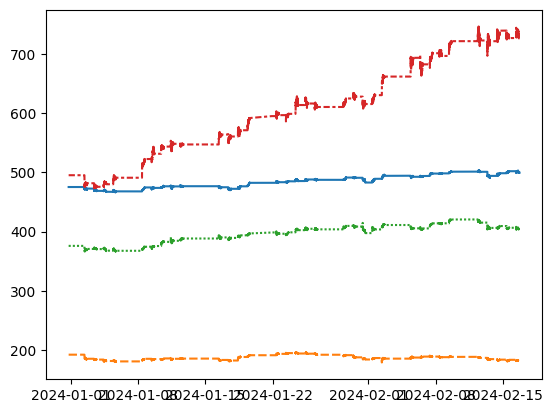

In [ ]:
sns.lineplot(df)

In [ ]:
aapl = pd.Series(df["AAPL"])

aapl

In [ ]:
sns.lineplot(aapl)

In [ ]:
aapl = np.log(aapl)
aapl

In [ ]:
sns.lineplot(aapl)

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(aapl.diff())
plt.xlabel('Date')
plt.ylabel('Differenced Cleaned AAPL Stock Price (log)')
plt.title('Differenced Cleaned AAPL Stock Price Time Series')
plt.axhline(0, color='black', linestyle='--', linewidth=1)
plt.show()

In [ ]:
adf_result = adfuller(aapl.diff().dropna())
print("ADF Test p-value:", adf_result[1])

# ACF and PACF plots for the differenced series
plt.figure(figsize=(12, 4))
plot_acf(aapl.diff().dropna(), lags=100, title='ACF of Differenced Cleaned AAPL Stock Price')
plt.show()

plt.figure(figsize=(12, 4))
plot_pacf(aapl.diff().dropna(), lags=100, title='PACF of Differenced Cleaned AAPL Stock Price')
plt.show()

# Third Approach

In [10]:
data = pd.DataFrame()
data['Price'] = prices2024['/ES']

In [11]:
data['return'] = np.log(data['Price']/data['Price'].shift(1))
data['direction'] = np.where(data['return'] > 0,1,0)
data.head()

,Price,return,direction
TimeStamp,,,
2023-12-31 17:59:08,4812.75,NaN,0
2023-12-31 17:59:11,4812.75,0.0,0
2023-12-31 17:59:14,4812.75,0.0,0
2023-12-31 17:59:17,4812.75,0.0,0
2023-12-31 17:59:20,4812.75,0.0,0


In [23]:
lags = 5

cols = []

for lag in range(1, lags +1):
  col = f'lag_{lag}'
  data[col] = data['return'].shift(lag)
  cols.append(col)

data.dropna(inplace=True)

## Model 1


In [29]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam, RMSprop
import random

In [33]:
optimizer = Adam(learning_rate=0.0001, ema_momentum=0.95)

In [32]:
def set_seeds(seed = 12):
  random.seed(seed)
  np.random.seed(seed)
  tf.random.set_seed(seed)

In [ ]:
model = Sequential()

In [ ]:
set_seeds()

model = Sequential()
model.add(Dense(32, activation = 'relu', input_shape= (lags+1,)))
model.add(Dense(32, activation = 'relu'))
model.add(Dense(1, activation = 'sigmoid'))
model.compile(optimizer = optimizer,
              loss = 'binary_crossentropy',
              metrics = ['accuracy'])

In [ ]:
train_set, test_set = np.split(data, [int(.70*len(data))])
mu, std = train_set.mean(), train_set.std()


In [ ]:
training_data = (train_set - mu)/std
test_data = (test_set - mu)/std

In [ ]:
# model = ''

''

In [ ]:
# cols.append('Price')
# cols.pop()

['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'Price']

In [ ]:
model.fit(training_data[cols], train_set['direction'], epochs = 30, verbose = False, validation_split = 0.2, shuffle = False)

In [ ]:
res = pd.DataFrame(model.history.history)

<Axes: >

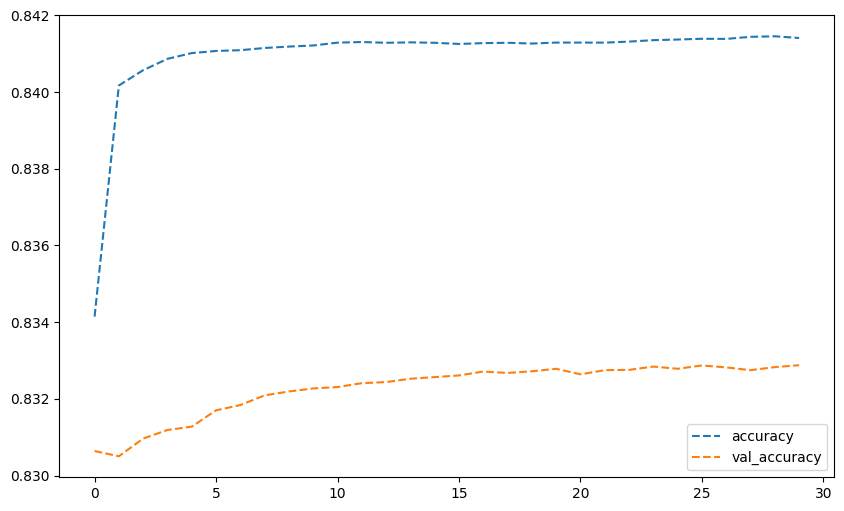

In [ ]:
res[['accuracy', 'val_accuracy']].plot(figsize=(10,6), style = '--')

In [ ]:
model.evaluate(training_data[cols], train_set['direction'])

,Price,return,direction,lag_1,lag_2,lag_3,lag_4,lag_5,prediction,strategy
TimeStamp,,,,,,,,,,
2023-12-31 17:59:26,4812.75,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,-1,-0.000000
2023-12-31 17:59:29,4812.75,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,-1,-0.000000
2023-12-31 17:59:32,4812.75,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,-1,-0.000000
2023-12-31 17:59:35,4812.75,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,-1,-0.000000
2023-12-31 17:59:38,4812.75,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,-1,-0.000000
...,...,...,...,...,...,...,...,...,...,...
2024-02-02 10:14:01,4939.75,0.000253,1,0.000000,0.000000,-0.000051,0.000000,-0.000051,-1,-0.000253
2024-02-02 10:14:04,4939.75,0.000000,0,0.000253,0.000000,0.000000,-0.000051,0.000000,-1,-0.000000
2024-02-02 10:14:07,4939.50,-0.000051,0,0.000000,0.000253,0.000000,0.000000,-0.000051,-1,0.000051


In [ ]:
pred = np.where(model.predict(training_data[cols]) > 0.5, 1,0)

21642/21642 [==============================] - 34s 2ms/step


In [ ]:
pred
pred[:30].flatten()

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0])

In [ ]:
train_set['prediction'] = np.where(pred > 0, -1,1)

In [ ]:
train_set['strategy'] = (train_set['prediction']*train_set['return'])

In [ ]:
train_set[['return', 'strategy']].sum().apply(np.exp)

return      1.026388
strategy    1.007266
dtype: float64

<Axes: xlabel='TimeStamp'>

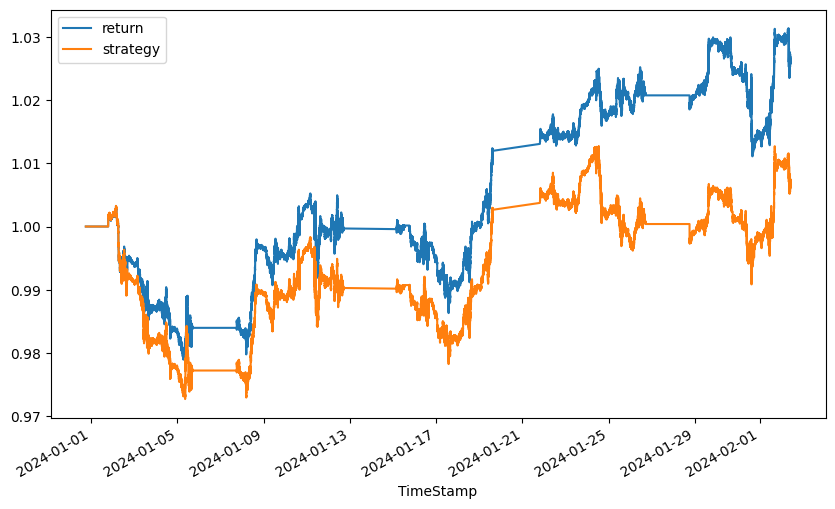

In [ ]:
train_set[['return','strategy']].cumsum().apply(np.exp).plot(figsize=(10,6))


In [ ]:
model.evaluate(test_data[cols], test_set['direction'])

9275/9275 [==============================] - 15s 2ms/step - loss: 0.4602 - accuracy: 0.8379


[0.46015045046806335, 0.8379414677619934]

In [ ]:
pred = np.where(model.predict(test_data[cols]) > 0.5, 1,0)

9275/9275 [==============================] - 16s 2ms/step


In [ ]:
test_set['prediction'] = np.where(pred>0,-1,1)

In [ ]:
test_set['prediction'].value_counts()

 1    295683
-1      1111
Name: prediction, dtype: int64

In [ ]:
test_set['strategy'] = (test_set['prediction']*test_set['return'])

In [ ]:
test_set[['return', 'strategy']].sum().apply(np.exp)

return      1.015132
strategy    1.006155
dtype: float64

<Axes: xlabel='TimeStamp'>

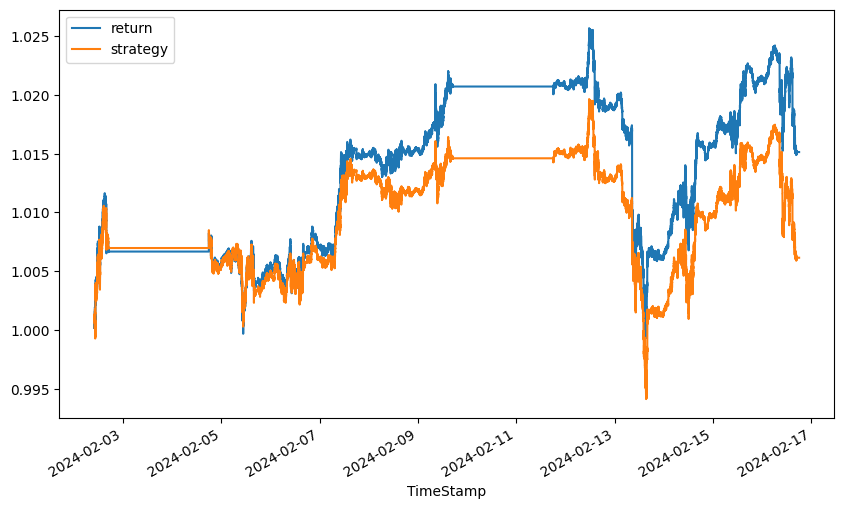

In [ ]:
test_set[['return','strategy']].cumsum().apply(np.exp).plot(figsize=(10,6))

## Model 2

In [13]:
data['momentum'] = data['return'].rolling(5).mean().shift(1)
data['volatility'] = data['return'].rolling(20).std().shift(1)
data['distance'] = (data['Price']-data['Price'].rolling(50).mean().shift(1))

In [15]:
data.dropna(inplace = True)

,Price,return,direction,lag_1,lag_2,lag_3,lag_4,lag_5,momentum,volatility,distance
TimeStamp,,,,,,,,,,,
2023-12-31 18:01:57,4812.75,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-12-31 18:02:00,4812.75,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-12-31 18:02:03,4812.75,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-12-31 18:02:06,4812.75,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-12-31 18:02:09,4812.75,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
2024-02-16 18:00:45,5014.50,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-02-16 18:00:48,5014.50,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-02-16 18:00:51,5014.50,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [25]:
cols.extend(['momentum','volatility','distance'])
# cols.pop(3)

['lag_1',
 'lag_2',
 'lag_3',
 'lag_4',
 'lag_5',
 'momentum',
 'volatility',
 'distance']

In [64]:
train_data, test_data = np.split(data, [int(.90*len(data))])
mu, std = train_data.mean(), train_data.std()

In [65]:
st_training_data = (train_data - mu)/std
st_test_data = (test_data - mu)/std

In [70]:
optimizer = Adam(learning_rate = 0.0001, ema_momentum = 0.95)

In [71]:
set_seeds()
model2 = Sequential()
model2.add(Dense(64, activation = 'relu', input_shape = (len(cols),)))
model2.add(Dense(64, activation = 'relu'))
model2.add(Dense(1, activation = 'sigmoid'))
model2.compile(optimizer = optimizer,
              loss = 'binary_crossentropy',
              metrics = ['accuracy'])

In [69]:
optimizer.build(model2.trainable_variables)

In [72]:
# %%time
model2.fit(st_training_data[cols],train_data['direction'],epochs = 12,verbose = False,validation_split = 0.2,shuffle = False)

In [73]:
model2.evaluate(st_training_data[cols],train_data['direction'])

27823/27823 [==============================] - 45s 2ms/step - loss: 0.3587 - accuracy: 0.8464


[0.3587471544742584, 0.8464065790176392]

In [74]:
pred = np.where(model2.predict(st_training_data[cols]) > 0.5, 1,0)

27823/27823 [==============================] - 42s 1ms/step


In [75]:
train_data['prediction'] = np.where(pred > 0,1,-1)

In [76]:
train_data['strategy'] = (train_data['prediction'] * train_data['return'])

In [77]:
train_data[['prediction']].value_counts()

prediction
-1            878519
 1             11812
dtype: int64

In [78]:
train_data[['return','strategy']].sum().apply(np.exp)

return      1.043167
strategy    3.527256
dtype: float64

<Axes: xlabel='TimeStamp'>

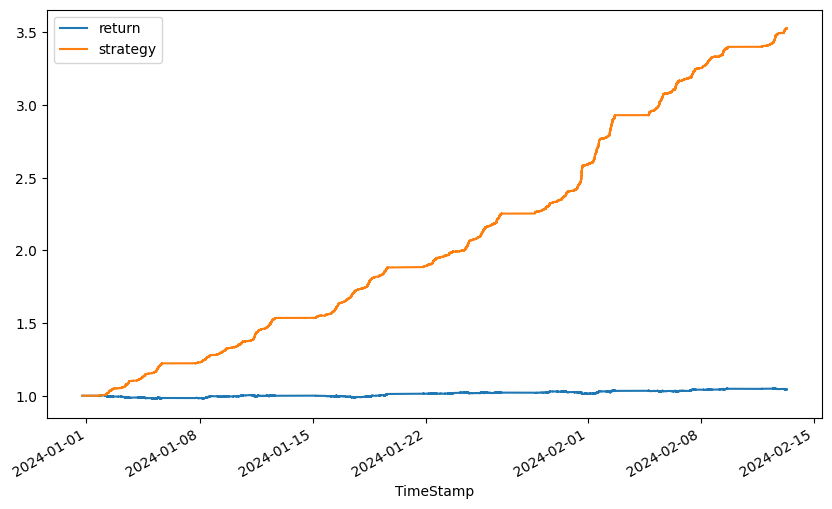

In [79]:
train_data[['return','strategy']].cumsum().apply(np.exp).plot(figsize=(10,6))

In [80]:
model2.evaluate(st_test_data[cols],test_data['direction'])

3092/3092 [==============================] - 6s 2ms/step - loss: 0.3977 - accuracy: 0.8220


[0.397701621055603, 0.8219679594039917]

In [81]:
pred = np.where(model2.predict(st_test_data[cols])>0.5, 1,0)

3092/3092 [==============================] - 4s 1ms/step


In [82]:
test_data['prediction'] = np.where(pred > 0 , 1 , -1)

In [83]:
test_data['prediction'].value_counts()

-1    97410
 1     1516
Name: prediction, dtype: int64

In [84]:
test_data['strategy'] = (test_data['prediction']*test_data['return'])

In [85]:
test_data[['strategy','return']].sum().apply(np.exp)

strategy    1.174512
return      0.998805
dtype: float64

<Axes: xlabel='TimeStamp'>

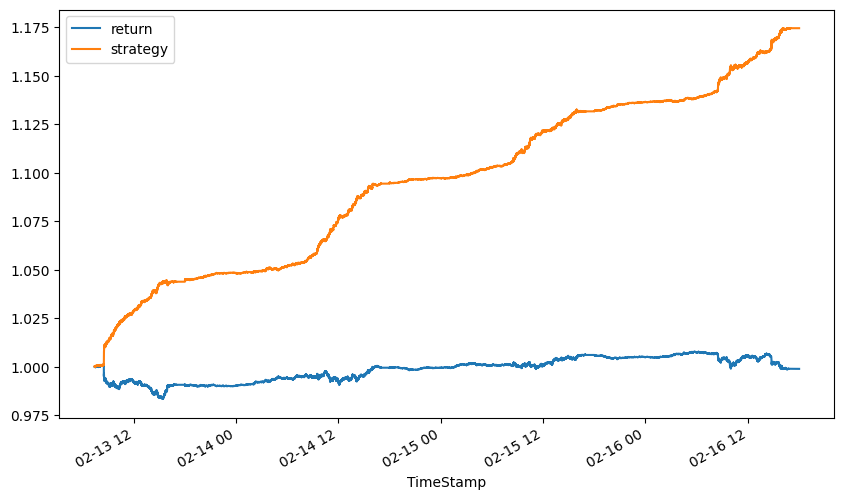

In [86]:
test_data[['return','strategy']].cumsum().apply(np.exp).plot(figsize=(10,6))

## Alt. Models

In [111]:
optimizer = Adam(learning_rate = 0.0001, ema_momentum = 0.95)

In [112]:
set_seeds()
model3 = Sequential()
model3.add(Dense(32, activation = 'relu', input_shape = (len(cols),)))
model3.add(Dense(16, activation = 'relu'))
model3.add(Dense(1, activation = 'sigmoid'))
model3.compile(optimizer = optimizer,
              loss = 'binary_crossentropy',
              metrics = ['accuracy'])

In [113]:
model3.fit(st_training_data[cols],train_data['direction'],epochs = 12,verbose = False,validation_split = 0.2,shuffle = False)

In [115]:
model3.evaluate(st_test_data[cols],test_data['direction'])

3092/3092 [==============================] - 6s 2ms/step - loss: 0.3944 - accuracy: 0.8220


[0.3944450914859772, 0.8219881653785706]

In [116]:
pred = np.where(model3.predict(st_test_data[cols])>0.5, 1,0)

3092/3092 [==============================] - 13s 4ms/step


In [117]:
test_data['prediction'] = np.where(pred > 0 , 1 , -1)
test_data['prediction'].value_counts()

-1    96866
 1     2060
Name: prediction, dtype: int64

In [118]:
test_data['strategy'] = (test_data['prediction']*test_data['return'])*0.3 #transaction costs
test_data[['strategy','return']].sum().apply(np.exp)

strategy    1.059735
return      0.998805
dtype: float64

<Axes: xlabel='TimeStamp'>

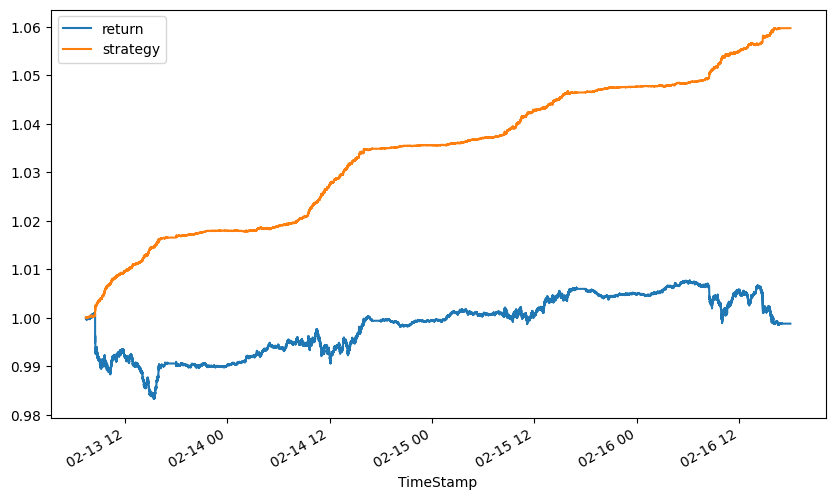

In [119]:
test_data[['return','strategy']].cumsum().apply(np.exp).plot(figsize=(10,6))

In [ ]:
from tensorflow.keras.optimizers import legacy

# Define the optimizer
optimizer = legacy.Adam()

# Compile the model with the optimizer
model2.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model
model2.fit(training_data[cols], training_data['direction'], epochs=12, verbose=False, validation_split=0.2, shuffle=False)


(TimeStamp
 2023-12-31 18:01:57   -0.436432
 2023-12-31 18:02:00   -0.436432
 2023-12-31 18:02:03   -0.436432
 2023-12-31 18:02:06   -0.436432
 2023-12-31 18:02:09   -0.436432
                          ...   
 2024-02-02 10:14:46    2.291302
 2024-02-02 10:14:49   -0.436432
 2024-02-02 10:14:52    2.291302
 2024-02-02 10:14:55   -0.436432
 2024-02-02 10:14:58    2.291302
 Name: direction, Length: 692483, dtype: float64,)

In [ ]:
optimizer.build(model2.trainable_variables)